# `Business Problem`

The data attached is about Car Accidents across Leeds City - UK for 2011.  The outcome is to predict Output Required

* Casualty Severity: (Slight, Serious, Fatal) 

## Widing Jupyter cells

In [1]:
## To Ignore Warnings 
from warnings import filterwarnings
filterwarnings('ignore')

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))

## Required Modules

In [3]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
from datasist.structdata import detect_outliers
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder,LabelEncoder
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler,SMOTENC
from imblearn.pipeline import Pipeline as ImbalancedPipeline
from sklearn.preprocessing import StandardScaler, RobustScaler,MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import CategoricalNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_validate, train_test_split
from sklearn.metrics import roc_auc_score, plot_confusion_matrix,classification_report,confusion_matrix,accuracy_score
from sklearn.model_selection import cross_validate, train_test_split,StratifiedKFold
from sklearn.feature_selection import RFE, SelectKBest, chi2
from sklearn.model_selection import GridSearchCV
import joblib as jb

## Reading & Exploring Data

In [4]:
# import the data as df
df = pd.read_excel('Road Accidents.xlsx')

In [5]:
# read sample of random records from df
df.sample(10)

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
1275,110306795.0,431884.0,435122.0,2.0,2011-07-05,1805.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,28.0,Car
149,110050723.0,429815.0,434603.0,2.0,2011-02-01,853.0,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,37.0,Car
346,110100336.0,428004.0,434221.0,2.0,2011-03-02,1043.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,25.0,Car
1373,110329679.0,428540.0,434269.0,4.0,2011-07-19,123.0,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Driver,Slight,Male,19.0,Car
1376,110329921.0,430230.0,432030.0,2.0,2011-07-19,845.0,A,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,17.0,Car
1437,110342695.0,427489.0,425486.0,2.0,2011-07-25,2205.0,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,18.0,Car
1378,110331002.0,433406.0,437242.0,1.0,2011-07-19,1435.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,17.0,Car
2536,110578626.0,436189.0,434321.0,2.0,2011-12-19,1510.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,45.0,Car
2465,110565810.0,424591.0,433586.0,1.0,2011-12-11,330.0,B,Dry,Darkness: street lighting unknown,Fine without high winds,Driver,Slight,Female,27.0,Car
769,110195929.0,429794.0,434067.0,2.0,2011-04-28,1820.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,65.0,Car


In [6]:
# get information about df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2604 entries, 0 to 2603
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Reference Number     2604 non-null   float64       
 1   Easting              2604 non-null   float64       
 2   Northing             2604 non-null   float64       
 3   Number of Vehicles   2604 non-null   float64       
 4   Accident Date        2604 non-null   datetime64[ns]
 5   Time (24hr)          2604 non-null   float64       
 6   1st Road Class       2604 non-null   object        
 7   Road Surface         2604 non-null   object        
 8   Lighting Conditions  2604 non-null   object        
 9   Weather Conditions   2604 non-null   object        
 10  Casualty Class       2604 non-null   object        
 11  Casualty Severity    2604 non-null   object        
 12  Sex of Casualty      2604 non-null   object        
 13  Age of Casualty      2604 non-nul

##### Dataset contains 15 columns with 2604 records 
#### 6 features are Numerical , one feature (Accident Date) are datetime type and 8 features are Categorical types  

------------------------------------------------------------------------------------------------------------------------------------------------

## Data Cleansing

In [7]:
# check duplicates data
df.duplicated().sum()

17

In [8]:
# Check for duplicated records
duplicated_records = df[df.duplicated()]
duplicated_records

,Reference Number,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
44,110027045.0,422224.0,433798.0,1.0,2011-01-18,800.0,B,Dry,Daylight: street lights present,Fine without high winds,Pedestrian,Slight,Male,15.0,Minibus (8 – 16 passenger seats)
220,110066343.0,430418.0,431777.0,2.0,2011-02-10,830.0,Motorway,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Female,38.0,Car
225,110068104.0,429797.0,433795.0,2.0,2011-02-11,340.0,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Passenger,Slight,Female,20.0,Taxi/Private hire car
300,110086003.0,429107.0,436244.0,2.0,2011-02-22,200.0,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Passenger,Slight,Female,19.0,Car
427,110122838.0,432525.0,427554.0,2.0,2011-03-15,1950.0,A,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Passenger,Slight,Female,17.0,Car
473,110131630.0,432202.0,433481.0,2.0,2011-03-21,830.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,40.0,Taxi/Private hire car
607,110167917.0,430130.0,437785.0,2.0,2011-04-08,1200.0,A,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,3.0,Car
626,110166627.0,426551.0,427392.0,2.0,2011-04-10,1835.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Female,19.0,Car
738,110188756.0,435817.0,434190.0,2.0,2011-04-23,1250.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Slight,Male,25.0,Car
761,110194474.0,430302.0,435025.0,2.0,2011-04-27,2305.0,Unclassified,Dry,Darkness: street lights present and lit,Fine without high winds,Passenger,Slight,Male,17.0,Taxi/Private hire car


* There are 17  duplicated records, so i will drop them.

In [9]:
# drop duplicated records
df.drop_duplicates(inplace=True)

In [10]:
# check the data nnow
df.shape

(2587, 15)

In [11]:
# Remove Reference Number feature as it is high cardinality
df.drop('Reference Number', axis=1, inplace=True)

In [12]:
# check data info
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2587 entries, 0 to 2603
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Easting              2587 non-null   float64       
 1   Northing             2587 non-null   float64       
 2   Number of Vehicles   2587 non-null   float64       
 3   Accident Date        2587 non-null   datetime64[ns]
 4   Time (24hr)          2587 non-null   float64       
 5   1st Road Class       2587 non-null   object        
 6   Road Surface         2587 non-null   object        
 7   Lighting Conditions  2587 non-null   object        
 8   Weather Conditions   2587 non-null   object        
 9   Casualty Class       2587 non-null   object        
 10  Casualty Severity    2587 non-null   object        
 11  Sex of Casualty      2587 non-null   object        
 12  Age of Casualty      2587 non-null   float64       
 13  Type of Vehicle      2587 non-nul

In [13]:
# check null values 
df.isnull().sum()

Easting                0
Northing               0
Number of Vehicles     0
Accident Date          0
Time (24hr)            0
1st Road Class         0
Road Surface           0
Lighting Conditions    0
Weather Conditions     0
Casualty Class         0
Casualty Severity      0
Sex of Casualty        0
Age of Casualty        0
Type of Vehicle        0
dtype: int64

* There are No Null Values ,but let us investigate further in some features.

In [14]:
# show value counts in each feature
for column in df.columns:
    value_counts = df[column].value_counts()
    print(f"Value counts for {column}:\n{value_counts}")
    print('*'*50)

Value counts for Easting:
431883.0    9
430797.0    8
430130.0    8
431884.0    7
430874.0    7
           ..
428861.0    1
421726.0    1
428147.0    1
424269.0    1
441284.0    1
Name: Easting, Length: 1712, dtype: int64
**************************************************
Value counts for Northing:
435042.0    10
435025.0    10
433457.0     8
434213.0     8
433481.0     7
            ..
442468.0     1
433911.0     1
432439.0     1
435166.0     1
434797.0     1
Name: Northing, Length: 1700, dtype: int64
**************************************************
Value counts for Number of Vehicles:
2.0    1581
1.0     642
3.0     239
4.0      92
5.0      24
6.0       6
8.0       3
Name: Number of Vehicles, dtype: int64
**************************************************
Value counts for Accident Date:
2011-10-07    20
2011-06-16    19
2011-10-01    18
2011-05-04    18
2011-07-25    18
              ..
2011-08-13     1
2011-04-04     1
2011-01-23     1
2011-02-23     1
2011-07-10     1
Name: Accid

* it seems there are unkonwn and strange values in  some features.

* Later on i will drop Ridden horse and Agricultural vehicle (includes diggers etc.) as there are few and will not add a value to the model later.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [15]:
# extreme numbers of cars 
df['Number of Vehicles'].replace({6.0: 5.0, 8.0: 5.0}, inplace=True)

In [16]:
# lighting conditions
df['Lighting Conditions'].replace({'Darkness: street lights present but unlit':'Darkness: street lighting unknown'},inplace=True)

In [17]:
df[df['Road Surface']==5.0]

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
2526,426648.0,441801.0,2.0,2011-12-18,2305.0,A,5.0,Darkness: street lights present and lit,Fine without high winds,Driver,Slight,Male,37.0,Car


In [18]:
# i'll drop the above  records with as it seems outliers as road surface is 5.0 and it is the only with this kind of Road Surface/
df.drop(2526,axis=0,inplace=True)

In [19]:
# check shape now
df.shape

(2586, 14)

In [20]:
# weather conditions
df[df['Weather Conditions']=='Unknown']

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
32,430308.0,433901.0,1.0,2011-01-16,1715.0,Unclassified,Wet / Damp,Darkness: street lighting unknown,Unknown,Pedestrian,Slight,Male,20.0,Car


In [21]:
# Find the mode of the 'Weather Conditions' column
weather_conditions_mode = df['Weather Conditions'].mode()[0]

# Replace 'unknown' with the mode
df['Weather Conditions'] = df['Weather Conditions'].replace('Unknown', weather_conditions_mode)

In [22]:
df['Weather Conditions'].unique()

array(['Raining without high winds', 'Fine without high winds',
       'Fine with high winds', 'Raining with high winds', 'Other',
       'Fog or mist – if hazard'], dtype=object)

In [23]:
# Time(24hr)
df['Time (24hr)'].describe()

count    2586.000000
mean     1406.713844
std       508.360447
min         5.000000
25%      1045.000000
50%      1455.000000
75%      1750.000000
max      2355.000000
Name: Time (24hr), dtype: float64

In [24]:
# check min value
df[df['Time (24hr)']==5.0]

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
288,431169.0,434987.0,1.0,2011-02-21,5.0,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,20.0,Car
792,424242.0,428222.0,2.0,2011-05-04,5.0,A,Dry,Darkness: street lighting unknown,Fine without high winds,Passenger,Slight,Female,0.0,Car
1377,431508.0,429658.0,1.0,2011-07-19,5.0,Unclassified,Dry,Darkness: street lighting unknown,Fine without high winds,Pedestrian,Slight,Female,47.0,Car


In [25]:
# check min value
df[df['Time (24hr)']<1000.0]

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
0,443330.0,439205.0,2.0,2011-01-12,712.0,A(M),Wet / Damp,Darkness: street lighting unknown,Raining without high winds,Driver,Slight,Male,62.0,Car
1,425059.0,433371.0,2.0,2011-01-12,830.0,Unclassified,Wet / Damp,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,39.0,Car
5,427893.0,434624.0,2.0,2011-01-13,755.0,Unclassified,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,26.0,Pedal cycle
6,421253.0,440320.0,1.0,2011-01-13,808.0,B,Wet / Damp,Darkness: street lighting unknown,Fine without high winds,Pedestrian,Serious,Female,11.0,Car
7,432494.0,433751.0,4.0,2011-01-13,900.0,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,61.0,Car
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2586,420518.0,445572.0,2.0,2011-12-28,939.0,A,Dry,Daylight: street lights present,Fine with high winds,Driver,Slight,Female,56.0,Car
2587,420518.0,445572.0,2.0,2011-12-28,939.0,A,Dry,Daylight: street lights present,Fine with high winds,Driver,Slight,Male,66.0,Car
2588,420518.0,445572.0,2.0,2011-12-28,939.0,A,Dry,Daylight: street lights present,Fine with high winds,Passenger,Slight,Male,54.0,Car
2594,428507.0,432642.0,2.0,2011-12-30,535.0,A,Wet / Damp,Darkness: street lights present and lit,Fine without high winds,Driver,Serious,Male,37.0,Motorcycle over 500cc


In [26]:
df[df['Time (24hr)']<10.0]

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
288,431169.0,434987.0,1.0,2011-02-21,5.0,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,20.0,Car
792,424242.0,428222.0,2.0,2011-05-04,5.0,A,Dry,Darkness: street lighting unknown,Fine without high winds,Passenger,Slight,Female,0.0,Car
1377,431508.0,429658.0,1.0,2011-07-19,5.0,Unclassified,Dry,Darkness: street lighting unknown,Fine without high winds,Pedestrian,Slight,Female,47.0,Car


In [27]:
df['Time (24hr)'] = pd.to_datetime(df['Time (24hr)'], format='%H%M', errors='coerce')

In [28]:
df['Time (24hr)'] = df['Time (24hr)'].dt.strftime('%H:%M')

In [29]:
df['Time (24hr)'].value_counts()

17:30    35
16:00    28
17:20    26
18:00    25
17:00    24
         ..
15:06     1
14:53     1
20:54     1
19:23     1
05:35     1
Name: Time (24hr), Length: 534, dtype: int64

In [30]:
df[df.isnull().any(axis=1)]

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle
288,431169.0,434987.0,1.0,2011-02-21,NaN,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Slight,Male,20.0,Car
792,424242.0,428222.0,2.0,2011-05-04,NaN,A,Dry,Darkness: street lighting unknown,Fine without high winds,Passenger,Slight,Female,0.0,Car
1377,431508.0,429658.0,1.0,2011-07-19,NaN,Unclassified,Dry,Darkness: street lighting unknown,Fine without high winds,Pedestrian,Slight,Female,47.0,Car


In [31]:
# will treat the min values as 500 as if 05:00 as it seems from Lighting Conditions it is before sunrise time.
df['Time (24hr)'].fillna('00:05',inplace=True)

In [32]:
# mising values
df.isnull().sum()

Easting                0
Northing               0
Number of Vehicles     0
Accident Date          0
Time (24hr)            0
1st Road Class         0
Road Surface           0
Lighting Conditions    0
Weather Conditions     0
Casualty Class         0
Casualty Severity      0
Sex of Casualty        0
Age of Casualty        0
Type of Vehicle        0
dtype: int64

------------------------------------------------------------------------------------------------------------------------------------------------

In [33]:
# 1st Road Class
df['1st Road Class'].value_counts()

Unclassified    1204
A                977
Motorway         166
B                163
A(M)              76
Name: 1st Road Class, dtype: int64

* Searching internet

M are motorways,the fastest roads,mostly between cities.

A are most main routes.

B are minor roads.

A(M) it upgraded to M.

In [34]:
# Replace 'A(M)' with 'M' in the '1st Road Class' column
df['1st Road Class'] = df['1st Road Class'].replace('A(M)', 'M')

------------------------------------------------------------------------------------------------------------------------------------------------

In [35]:
# check the balnace of the target feture (Casualty Severity)
df['Casualty Severity'].value_counts(normalize=True)

Slight     0.887471
Serious    0.102862
Fatal      0.009667
Name: Casualty Severity, dtype: float64

* There are imbalance in the target feature we'll deal with it later.

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2586 entries, 0 to 2603
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Easting              2586 non-null   float64       
 1   Northing             2586 non-null   float64       
 2   Number of Vehicles   2586 non-null   float64       
 3   Accident Date        2586 non-null   datetime64[ns]
 4   Time (24hr)          2586 non-null   object        
 5   1st Road Class       2586 non-null   object        
 6   Road Surface         2586 non-null   object        
 7   Lighting Conditions  2586 non-null   object        
 8   Weather Conditions   2586 non-null   object        
 9   Casualty Class       2586 non-null   object        
 10  Casualty Severity    2586 non-null   object        
 11  Sex of Casualty      2586 non-null   object        
 12  Age of Casualty      2586 non-null   float64       
 13  Type of Vehicle      2586 non-nul

-------------------------------------------------------------------------------------------------------------------------------------------------

In [37]:
# Description of Numerical data
df.describe()

,Easting,Northing,Number of Vehicles,Age of Casualty
count,2586.000000,2586.000000,2586.000000,2586.000000
mean,430129.478732,434251.856922,1.953596,35.351895
std,5130.195133,4383.225705,0.771953,18.482485
min,415290.000000,424216.000000,1.000000,0.000000
25%,427128.250000,431779.250000,2.000000,22.000000
50%,430098.000000,434231.500000,2.000000,32.000000
75%,432515.250000,436169.000000,2.000000,46.000000
max,444895.000000,449409.000000,5.000000,95.000000


* There are outliers in Age of Casualty

In [38]:
# Description of Categorical data
df.describe(include=['O'])

,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Type of Vehicle
count,2586,2586,2586,2586,2586,2586,2586,2586,2586
unique,535,5,3,4,6,3,3,2,15
top,17:30,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,Car
freq,35,1204,1998,1919,2268,1549,2295,1538,1783


------------------------------------------------------------------------------------------------------------------------------------------------

## Feature Engineering

* According to the link above the daylight period for leeds city in year 2011 is from 8:00 am to 4:00 pm.

In [39]:
# time period
def categorize_time_period(time):
    # Convert the time string to a datetime object for easier comparison
    time = pd.to_datetime(time, format='%H:%M')

    if (time >= pd.to_datetime('00:00', format='%H:%M')) and (time < pd.to_datetime('08:00', format='%H:%M')):
        return 'After Midnight'
    elif (time >= pd.to_datetime('08:00', format='%H:%M')) and (time < pd.to_datetime('12:00', format='%H:%M')):
        return 'Morning'
    elif (time >= pd.to_datetime('12:00', format='%H:%M')) and (time < pd.to_datetime('16:00', format='%H:%M')):
        return 'Afternoon'
    elif (time >= pd.to_datetime('16:00', format='%H:%M')) and (time <= pd.to_datetime('23:59', format='%H:%M')):
        return 'Night'

# Replace this with your actual column name if needed
df['TimePeriod'] = df['Time (24hr)'].apply(categorize_time_period)

In [40]:
# show df
df

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle,TimePeriod
0,443330.0,439205.0,2.0,2011-01-12,07:12,M,Wet / Damp,Darkness: street lighting unknown,Raining without high winds,Driver,Slight,Male,62.0,Car,After Midnight
1,425059.0,433371.0,2.0,2011-01-12,08:30,Unclassified,Wet / Damp,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,39.0,Car,Morning
2,420683.0,434373.0,1.0,2011-01-12,12:15,A,Wet / Damp,Daylight: street lights present,Fine without high winds,Pedestrian,Serious,Male,66.0,Car,Afternoon
3,431097.0,433000.0,1.0,2011-01-12,17:35,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Serious,Male,39.0,Goods vehicle 3.5 tonnes mgw and under,Night
4,429523.0,433820.0,2.0,2011-01-12,12:30,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,29.0,Car,Afternoon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,428984.0,435435.0,1.0,2011-12-31,13:05,A,Wet / Damp,Daylight: street lights present,Raining without high winds,Pedestrian,Slight,Male,10.0,Car,Afternoon
2600,428058.0,432860.0,1.0,2011-12-31,12:08,Unclassified,Wet / Damp,Darkness: street lighting unknown,Raining without high winds,Passenger,Slight,Male,17.0,Car,Afternoon
2601,435402.0,436161.0,1.0,2011-12-31,10:00,Unclassified,Wet / Damp,Daylight: street lights present,Fine with high winds,Passenger,Slight,Female,79.0,Bus or coach (17 or more passenger seats),Morning
2602,431237.0,434797.0,2.0,2011-12-31,14:45,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,24.0,Car,Afternoon


In [41]:
df['Month']=df['Accident Date'].dt.month_name()
df['Day']= df['Accident Date'].dt.day_name()
df['Year']=df['Accident Date'].dt.year

In [42]:
# show df
df

,Easting,Northing,Number of Vehicles,Accident Date,Time (24hr),1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle,TimePeriod,Month,Day,Year
0,443330.0,439205.0,2.0,2011-01-12,07:12,M,Wet / Damp,Darkness: street lighting unknown,Raining without high winds,Driver,Slight,Male,62.0,Car,After Midnight,January,Wednesday,2011
1,425059.0,433371.0,2.0,2011-01-12,08:30,Unclassified,Wet / Damp,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,39.0,Car,Morning,January,Wednesday,2011
2,420683.0,434373.0,1.0,2011-01-12,12:15,A,Wet / Damp,Daylight: street lights present,Fine without high winds,Pedestrian,Serious,Male,66.0,Car,Afternoon,January,Wednesday,2011
3,431097.0,433000.0,1.0,2011-01-12,17:35,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Serious,Male,39.0,Goods vehicle 3.5 tonnes mgw and under,Night,January,Wednesday,2011
4,429523.0,433820.0,2.0,2011-01-12,12:30,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,29.0,Car,Afternoon,January,Wednesday,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,428984.0,435435.0,1.0,2011-12-31,13:05,A,Wet / Damp,Daylight: street lights present,Raining without high winds,Pedestrian,Slight,Male,10.0,Car,Afternoon,December,Saturday,2011
2600,428058.0,432860.0,1.0,2011-12-31,12:08,Unclassified,Wet / Damp,Darkness: street lighting unknown,Raining without high winds,Passenger,Slight,Male,17.0,Car,Afternoon,December,Saturday,2011
2601,435402.0,436161.0,1.0,2011-12-31,10:00,Unclassified,Wet / Damp,Daylight: street lights present,Fine with high winds,Passenger,Slight,Female,79.0,Bus or coach (17 or more passenger seats),Morning,December,Saturday,2011
2602,431237.0,434797.0,2.0,2011-12-31,14:45,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,24.0,Car,Afternoon,December,Saturday,2011


In [43]:
df['Year'].describe()

count    2586.0
mean     2011.0
std         0.0
min      2011.0
25%      2011.0
50%      2011.0
75%      2011.0
max      2011.0
Name: Year, dtype: float64

In [44]:
# drop year feature as it's only contains year 2011.
df.drop('Year', axis=1,inplace=True)

In [45]:
# drop Time (24hr) and Accident Date features as we have a data extract from it to avoid Multicollinarity later on.
df.drop(['Time (24hr)','Accident Date'], axis=1,inplace=True)

In [46]:
# show df 
df.columns

Index(['Easting', 'Northing', 'Number of Vehicles', '1st Road Class',
       'Road Surface', 'Lighting Conditions', 'Weather Conditions',
       'Casualty Class', 'Casualty Severity', 'Sex of Casualty',
       'Age of Casualty', 'Type of Vehicle', 'TimePeriod', 'Month', 'Day'],
      dtype='object')

In [47]:
df[(df['Casualty Severity']=='Fatal') & (df['1st Road Class']=='Unclassified')]

,Easting,Northing,Number of Vehicles,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Age of Casualty,Type of Vehicle,TimePeriod,Month,Day
93,424032.0,442013.0,1.0,Unclassified,Wet / Damp,Darkness: no street lighting,Fine without high winds,Passenger,Fatal,Male,18.0,Car,Night,January,Tuesday
397,435029.0,427793.0,3.0,Unclassified,Dry,Darkness: street lights present and lit,Fine with high winds,Driver,Fatal,Male,24.0,Motorcycle over 125cc and up to 500cc,After Midnight,March,Thursday
402,429931.0,432968.0,1.0,Unclassified,Wet / Damp,Daylight: street lights present,Raining with high winds,Pedestrian,Fatal,Male,35.0,Goods vehicle 7.5 tonnes mgw and over,Afternoon,March,Thursday
993,430945.0,435170.0,1.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Pedestrian,Fatal,Female,9.0,Car,Night,May,Tuesday
1014,430102.0,433930.0,1.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Pedestrian,Fatal,Female,91.0,Car,Afternoon,June,Friday
1115,428799.0,430908.0,3.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Passenger,Fatal,Male,32.0,Car,Night,June,Wednesday
1263,431697.0,427879.0,2.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Fatal,Male,86.0,Other Vehicle,Night,July,Saturday
1950,430268.0,434835.0,1.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Pedestrian,Fatal,Female,79.0,Car,Afternoon,October,Wednesday
2463,421632.0,434561.0,1.0,Unclassified,Dry,Darkness: street lighting unknown,Fine without high winds,Pedestrian,Fatal,Male,85.0,Taxi/Private hire car,Night,December,Saturday


------------------------------------------------------------------------------------------------------------------------------------------------

# EDA

### Uni-variate analysis

In [48]:
# Create a Age of Casualty histogram
fig = px.histogram(df, x="Age of Casualty", nbins=20, title="Distribution of Age of Casualty")
fig.update_layout(xaxis_title="Age of Casualty", yaxis_title="Count")
fig.show()

In [49]:
# Create a box plot for the 'Age of Casualty' column
fig = px.box(df, y='Age of Casualty', title='Box Plot of Age of Casualty')
fig.show()

* little outliers we will keep it right now.

In [50]:
# Create a box plot for the 'Age of Casualty' column
fig = px.box(df, y='Number of Vehicles', title='Box Plot of Number of Vehicles')
fig.show()

In [51]:
# Create a pie chart for Casualty Severity
fig = px.pie(df, names='Casualty Severity', title='Pie Chart: Casualty Severity',
             labels={'Casualty Severity': 'Severity'},
             hover_data=['Casualty Severity'],
             hole=0.3,  # Set the size of the center hole (0 to 1)
             color_discrete_sequence=px.colors.qualitative.Set3)  # Set color palette

# Show the plot
fig.show()

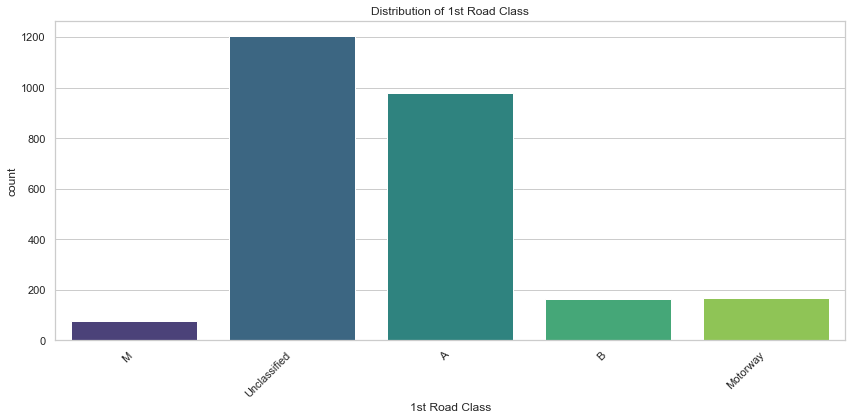

**********************************************************************************************************************************


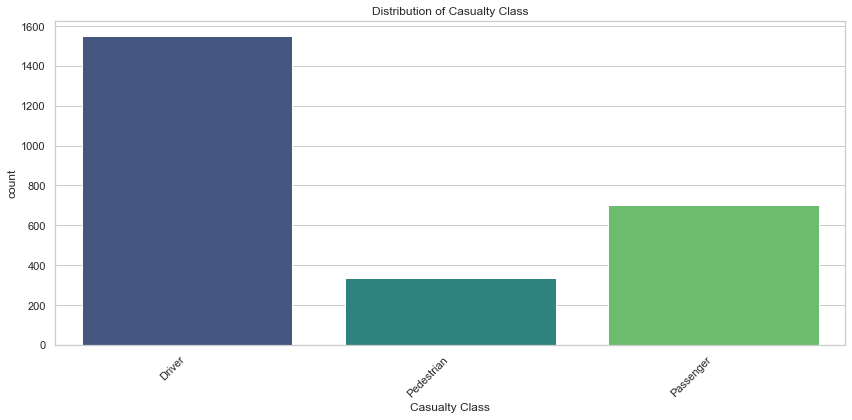

**********************************************************************************************************************************


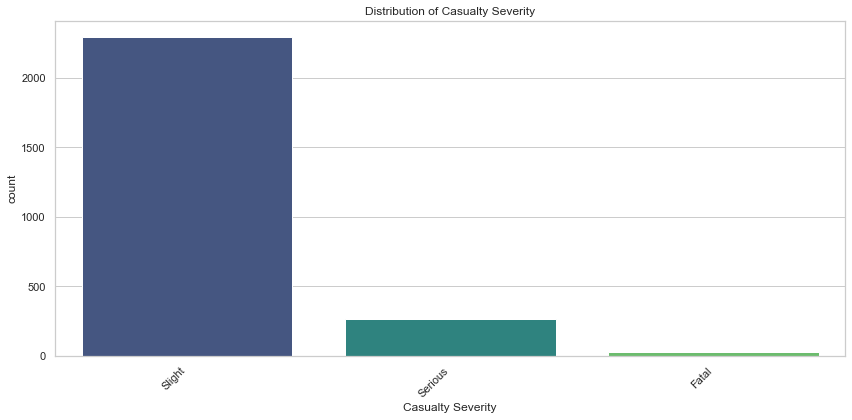

**********************************************************************************************************************************


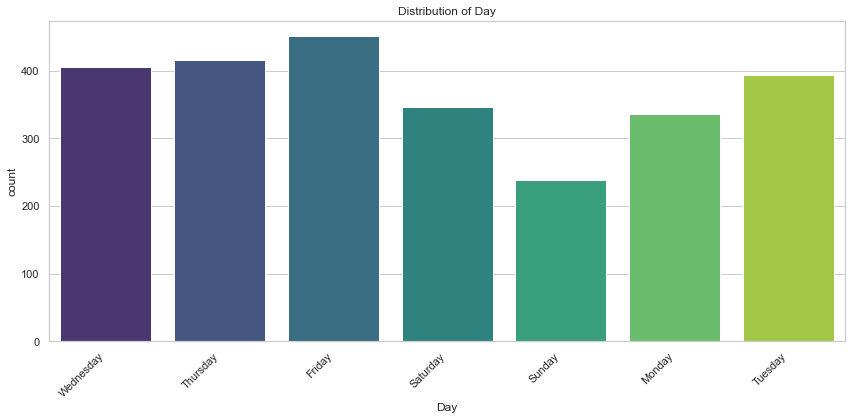

**********************************************************************************************************************************


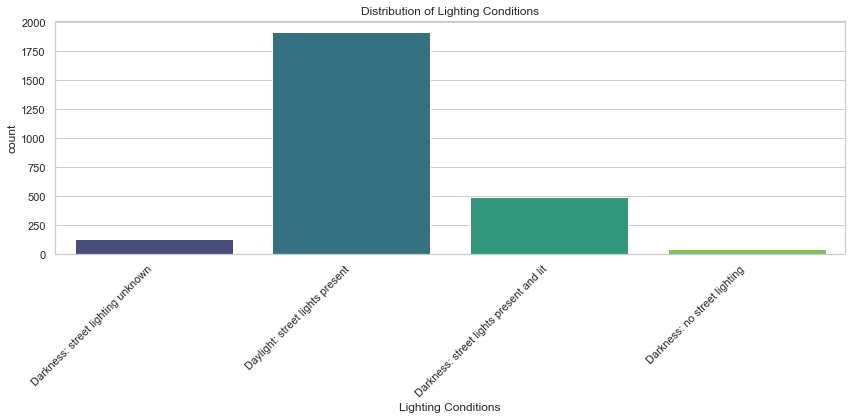

**********************************************************************************************************************************


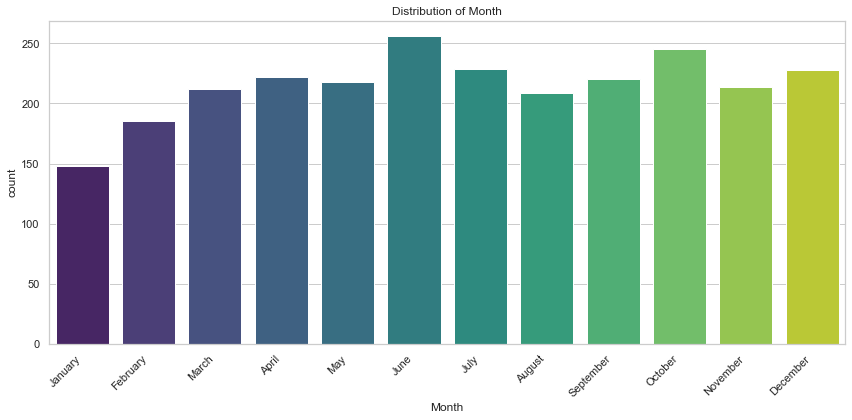

**********************************************************************************************************************************


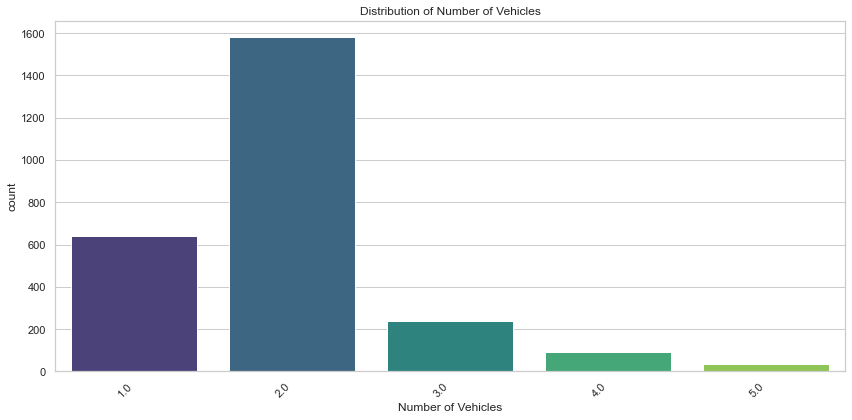

**********************************************************************************************************************************


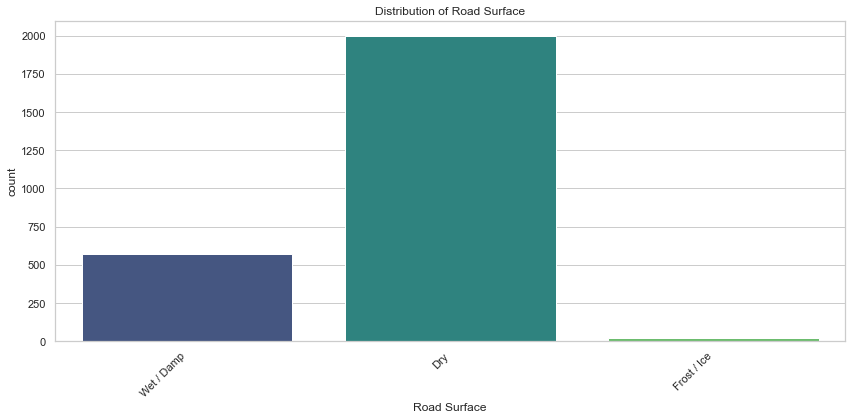

**********************************************************************************************************************************


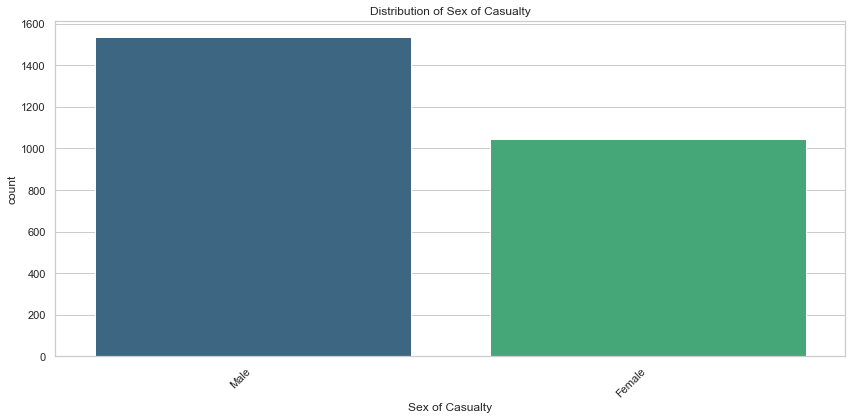

**********************************************************************************************************************************


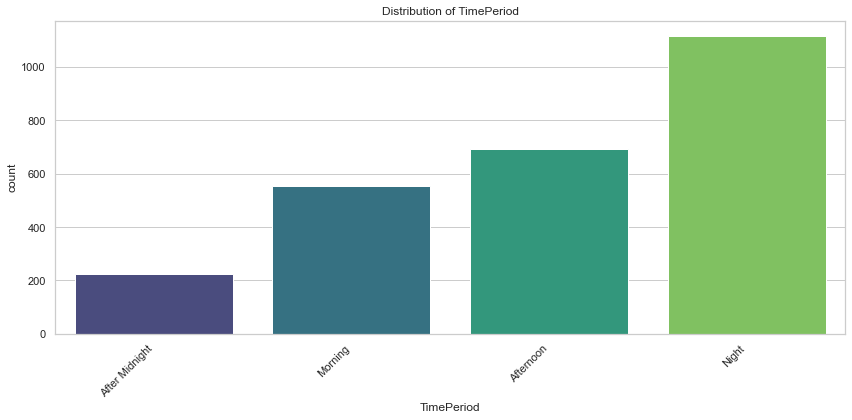

**********************************************************************************************************************************


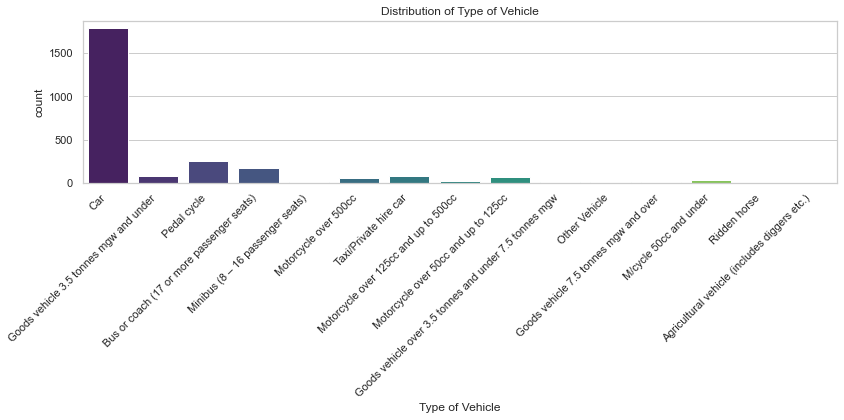

**********************************************************************************************************************************


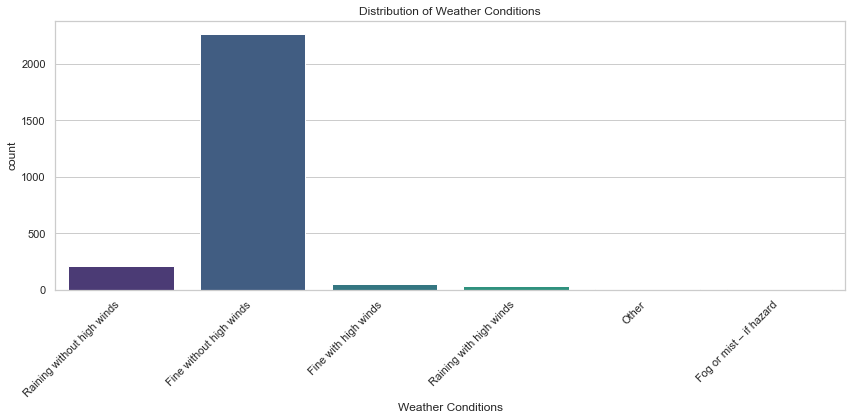

**********************************************************************************************************************************


In [52]:
# Set the style for seaborn
sns.set(style="whitegrid")

# Univariate analysis
def univariate_analysis(feature):
    plt.figure(figsize=(12, 6))
    plt.title(f'Distribution of {feature}')
    sns.countplot(x=feature, data=df, palette="viridis")
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()
    print('*'*130)

for feature in df.columns.difference(["Age of Casualty", 'Easting', 'Northing']):
    univariate_analysis(feature)

------------------------------------------------------------------------------------------------------------------------------------------------

### Conclusions:

* Most age records for Casulaty Severity is between 20-30 years old.

* Dominant Weather Conditions is fine without high winds.

* Most dominant type of vehicles is Car.

* It seems most of the accidents occurs at night & the least period is Midnight (wierd);maybe leeds citizen do not hang-out too much in late hrs.

* Male are having high Accident Casuality than female and most of them are Driving cars.

* Most accident occurs on Dry road surface.

* Dominant number of cars in the accident is 2 vehicles (expected).

* Most months having accidents are June,July (Summer vacations) ,October and December.

* Most accidents occurs in the daylight (unexpected); maybe  many peolpe being in the street in the daylight period.

* Friday & Thursday are having more accidents than other weekdays.

* Slight is the dominant type for Casualty Severity (Normal) then serious type.
 
* Most of the Accidents happened on Unclassified & A class roads.

-------------------------------------------------------------------------------------------------------------------------------------------------

### Bi-variate analysis

In [53]:
# Create a scatter plot for Age of Casualty vs Casualty Severity
fig = px.scatter(df, x='Age of Casualty', y='Casualty Severity', color='Casualty Severity',
                 title='Scatter Plot of Age of Casualty vs Casualty Severity',
                 labels={'Age of Casualty': 'Age of Casualty', 'Casualty Severity': 'Casualty Severity'})

# Show the plot
fig.show()

In [54]:
# Create a scatter plot for Number of Vehicles vs Age of Casualty, colored by Casualty Severity
fig = px.scatter(df, x='Number of Vehicles', y='Age of Casualty', color='Casualty Severity',
                 title='Scatter Plot: Number of Vehicles vs Age of Casualty',
                 labels={'Number of Vehicles': 'Number of Vehicles', 'Age of Casualty': 'Age of Casualty'})

# Show the plot
fig.show()

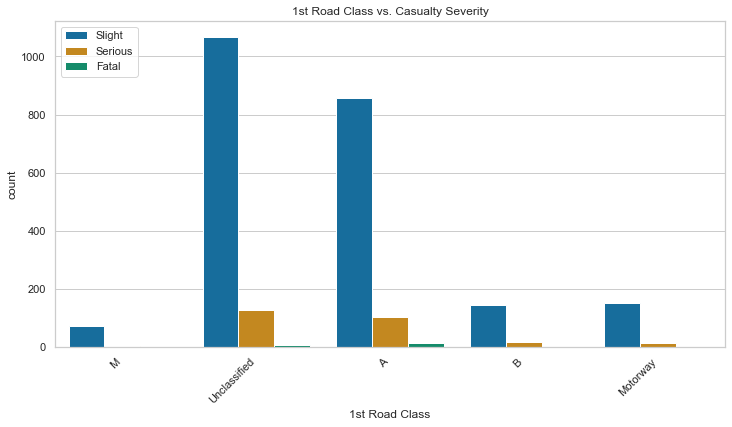

**********************************************************************************************************************************


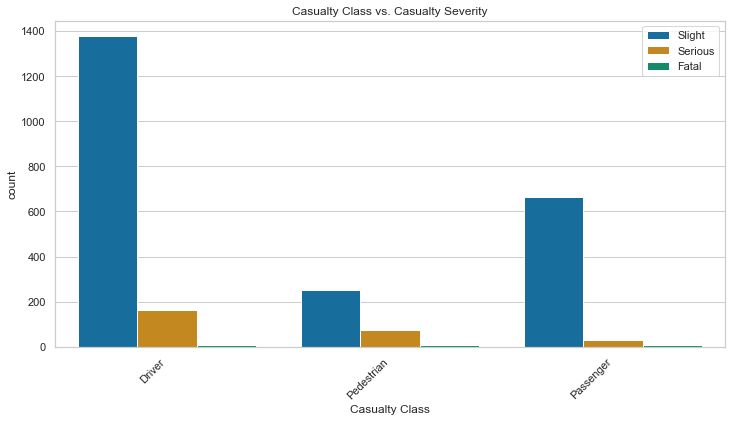

**********************************************************************************************************************************


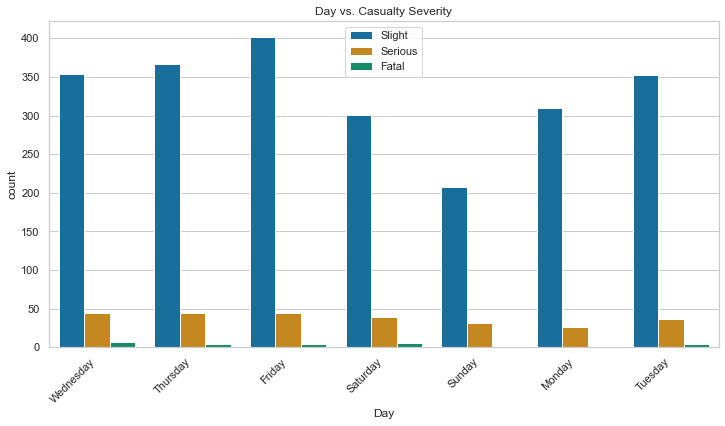

**********************************************************************************************************************************


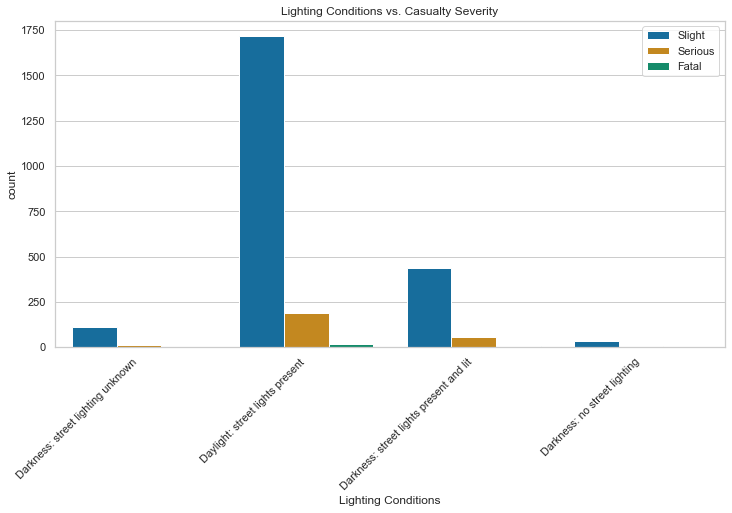

**********************************************************************************************************************************


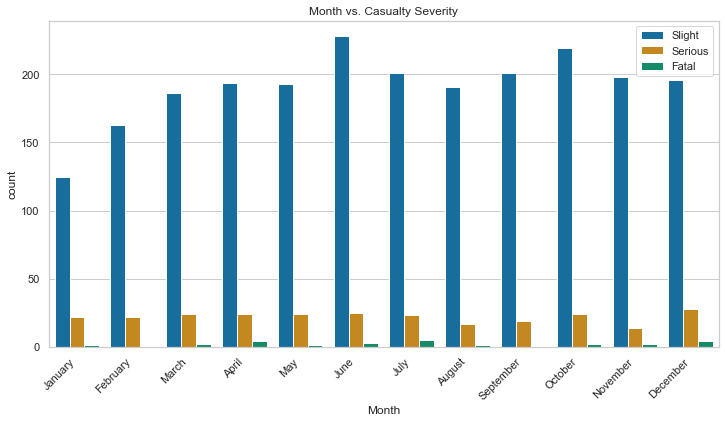

**********************************************************************************************************************************


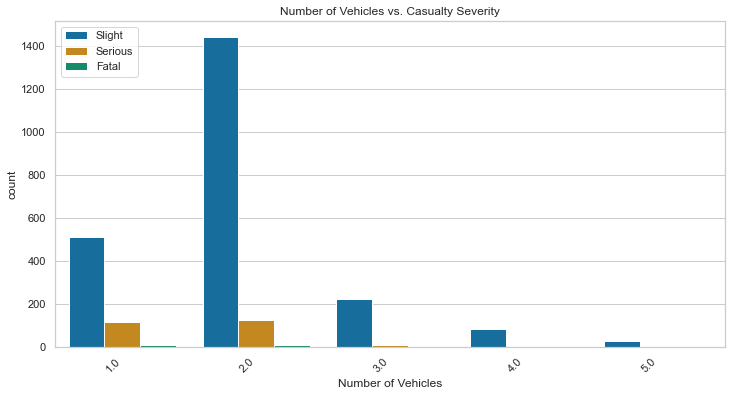

**********************************************************************************************************************************


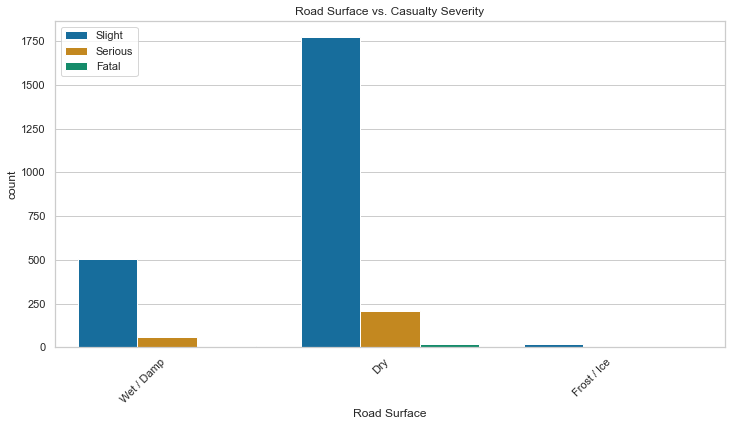

**********************************************************************************************************************************


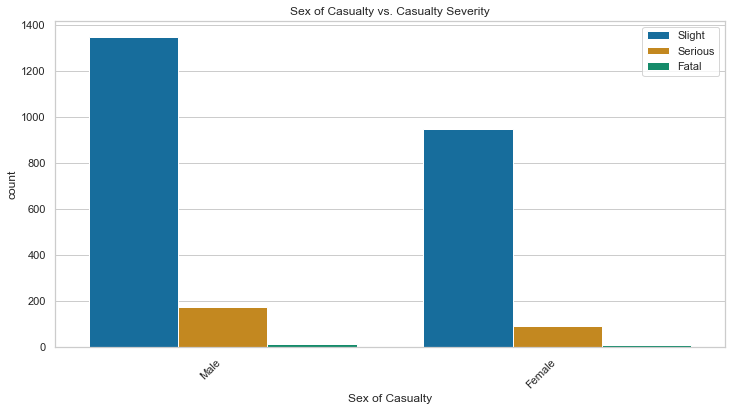

**********************************************************************************************************************************


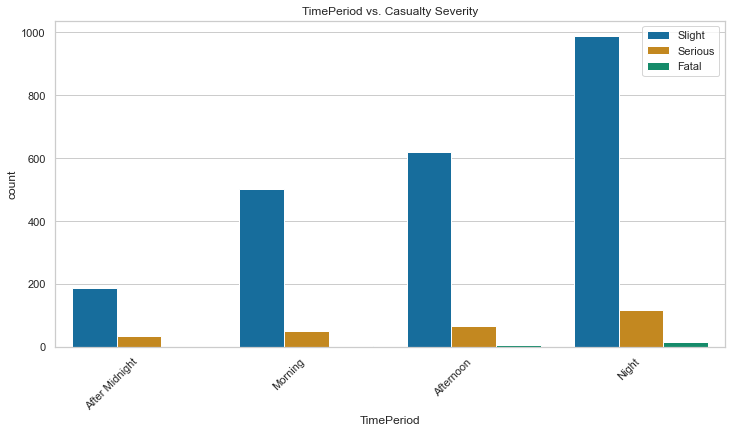

**********************************************************************************************************************************


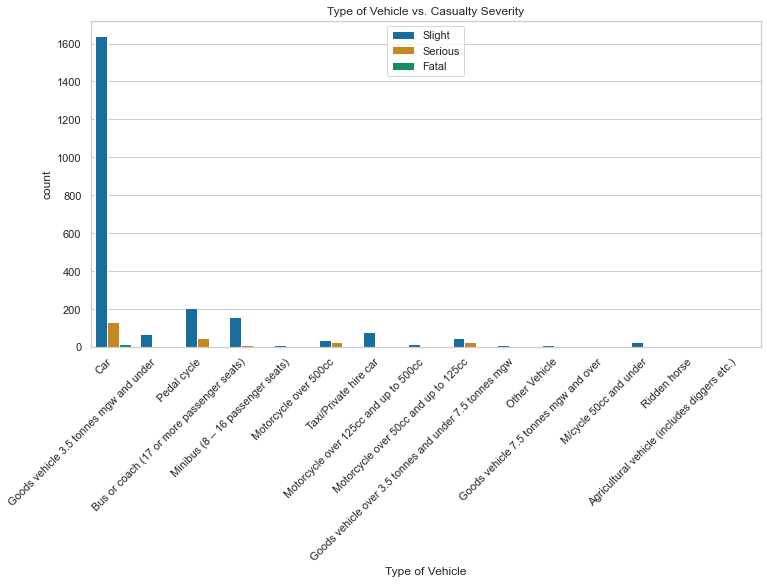

**********************************************************************************************************************************


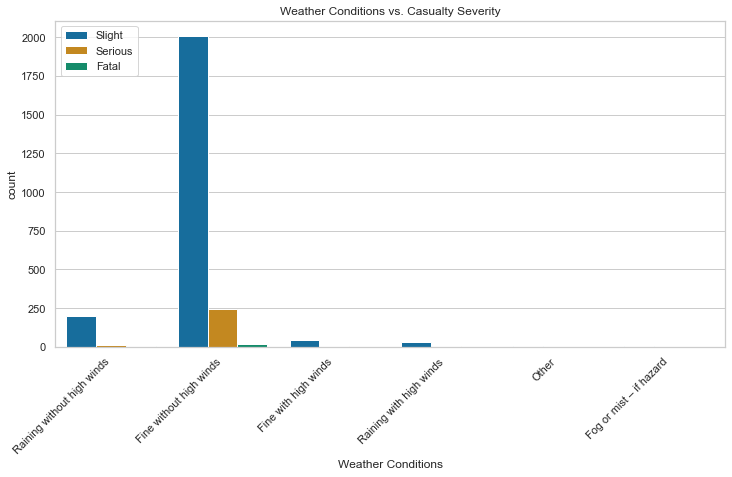

**********************************************************************************************************************************


In [55]:
# Bivariate analysis with respect to Casualty Severity

# Set the target column
target_column = 'Casualty Severity'

def bivariate_analysis(feature):
    plt.figure(figsize=(12, 6))
    plt.title(f'{feature} vs. {target_column}')
    sns.countplot(x=feature, hue=target_column, data=df, palette='colorblind')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
    plt.legend(loc='best')  # Set the legend at the best location
    plt.show()
    print('*'*130)

for feature in df.columns.difference(["Age of Casualty", 'Easting', 'Northing','Casualty Severity']):
    bivariate_analysis(feature)


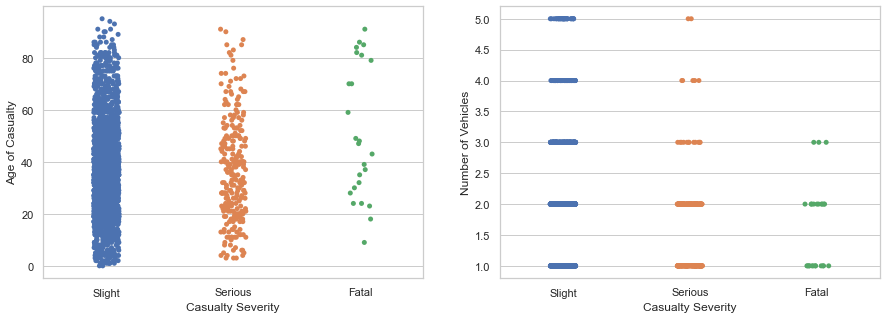

In [56]:
fig, axes = plt.subplots(1,2, figsize=(15, 5))
sns.stripplot(ax=axes[0], x=df['Casualty Severity'], y=df["Age of Casualty"])
sns.stripplot(ax=axes[1], x=df['Casualty Severity'], y=df["Number of Vehicles"])
plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------

### Conclusions:

* Most age records for Fetals casuality  are 20-40 years old then over 80 yeras old.

* No Fatal accidents appear when no. of cars is more than 3 vechles.

* Most Fatal Casuality occurs on A roads and Serious accidents on Unclassified roads then A roads.

* No Fatal accidents occurs for Passenger only occurs for(Driver and Pedestrian).

* It seems Friday is a nightmare for accidents in Year 2011.

* Daylight is the dominant in Serious and Fatal accidents .

* Fatal accidents occurs only Dry road surface and only slight accidents on Frost/Ice surface road.

* Fatal occurs for number of vehcles of 1 and 2 cars.

* Most months having accidents are June but July is the dominant in Fatal accidents then December.

* Most of the Victims are Males.

* No serious or Fatal accidents occurs in bad weathers (unexpected).

* Most of the Accidents happened on Unclassified & A class roads.

--------------------------------------------------------------------------------------------------------------------------------

In [57]:
from pyproj import Proj, transform, CRS

# Define the coordinate systems
grid_ref = CRS.from_epsg(27700)  # British National Grid
wgs84 = CRS('EPSG:4326')  # WGS84 (lat/long)

# Convert Easting and Northing to latitude and longitude
df['Latitude'], df['Longitude'] = transform(grid_ref, wgs84, df['Easting'].values, df['Northing'].values)

In [58]:
import folium
from folium.plugins import MarkerCluster

# If it's not already a string, convert it to string for popup display
df['Casualty Severity'] = df['Casualty Severity'].astype(str)

locationlist = df[["Latitude", "Longitude"]].values.tolist()

m = folium.Map(location=[53.794414, -1.548621], tiles='openstreetmap', zoom_start=15)
marker_cluster = MarkerCluster().add_to(m)

# Define colors and radii for different categories
category_info = {
    'Slight': {'color': 'green', 'radius': 15},
    'Serious': {'color': 'orange', 'radius': 15},
    'Fatal': {'color': 'red', 'radius': 100}
}

for i in range(0, len(locationlist)):
    category = df["Casualty Severity"].values[i]
    info = category_info.get(category)  
    
    folium.CircleMarker(locationlist[i], 
                        radius=info['radius'],
                        popup=f"Casualty Severity: {category}",
                        color=info['color'],
                        fill_color=info['color']).add_to(marker_cluster)

# Display the map
m

------------------------------------------------------------------------------------------------------------------------------------------------

* From the above analyses, it is very much clear that most of the accidents which occured within the provided region comes under the age group of 17-30, and Fatals occurs maily inside range (20,40)  and notably most of them are falls under the male category. Furthermore, it clearly shows that most of the accidents are occured in the daylight time at single carriageway. Most of the victims of these car accidents are drivers and most of them are males followed by females

--------------------------------------------------------------------------------------------------------------------------------

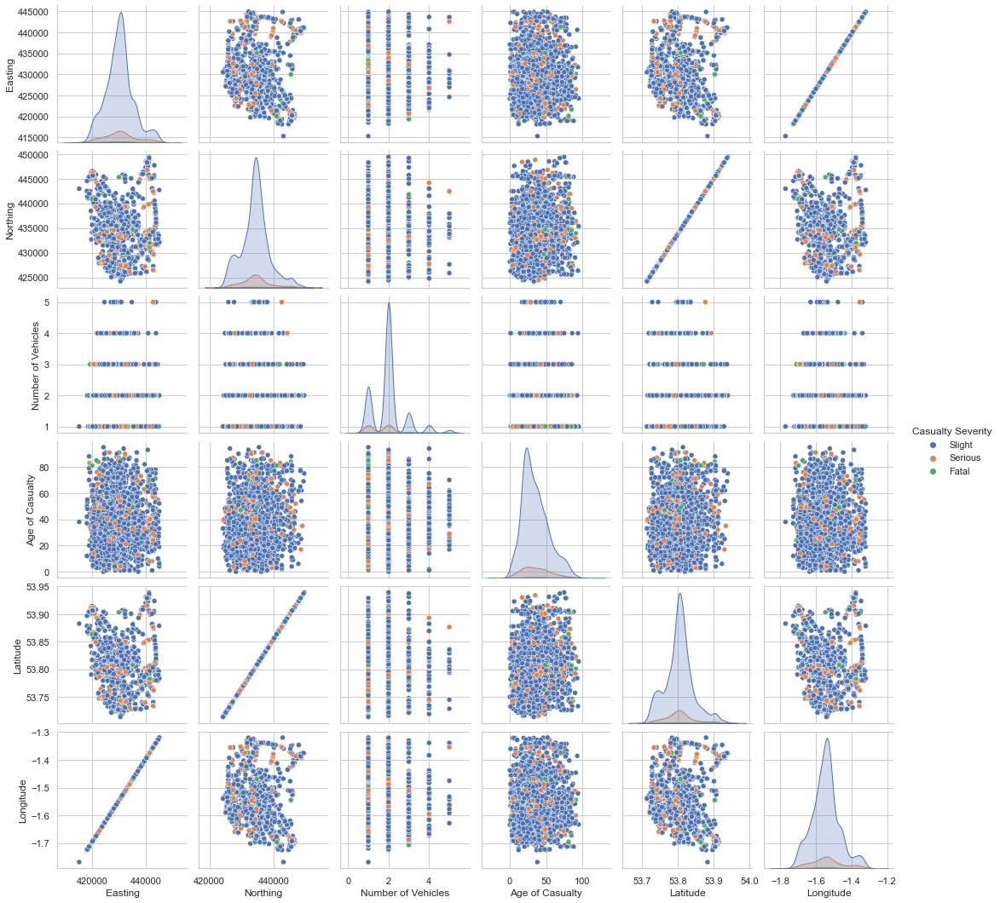

In [59]:
#pair ploting for df

sns.pairplot(df,hue='Casualty Severity')
plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------

In [60]:
bin_edges = [0, 20, 40, 60, 80, 100]
df['Age_Category'] = pd.cut(df['Age of Casualty'], bins=bin_edges, labels=['0-20', '20-40', '40-60', '60-80', '80-100'])

# Display the value counts for the new categorical column
print(df['Age_Category'].value_counts())

20-40     1134
40-60      589
0-20       578
60-80      229
80-100      54
Name: Age_Category, dtype: int64


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2586 entries, 0 to 2603
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Easting              2586 non-null   float64 
 1   Northing             2586 non-null   float64 
 2   Number of Vehicles   2586 non-null   float64 
 3   1st Road Class       2586 non-null   object  
 4   Road Surface         2586 non-null   object  
 5   Lighting Conditions  2586 non-null   object  
 6   Weather Conditions   2586 non-null   object  
 7   Casualty Class       2586 non-null   object  
 8   Casualty Severity    2586 non-null   object  
 9   Sex of Casualty      2586 non-null   object  
 10  Age of Casualty      2586 non-null   float64 
 11  Type of Vehicle      2586 non-null   object  
 12  TimePeriod           2586 non-null   object  
 13  Month                2586 non-null   object  
 14  Day                  2586 non-null   object  
 15  Latitude             

In [62]:
# drop  features do not need them any more.
ml_df=df.drop(['Latitude','Longitude','Easting','Northing','Age of Casualty'],axis=1)

In [63]:
#
ml_df[(ml_df['Type of Vehicle']=='Ridden horse') | (ml_df['Type of Vehicle']== 'Agricultural vehicle (includes diggers etc.)')]

,Number of Vehicles,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Type of Vehicle,TimePeriod,Month,Day,Age_Category
327,2.0,Unclassified,Wet / Damp,Daylight: street lights present,Fine without high winds,Driver,Serious,Female,Ridden horse,Morning,February,Sunday,40-60
1291,2.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,Agricultural vehicle (includes diggers etc.),Afternoon,July,Thursday,20-40
2409,2.0,Unclassified,Wet / Damp,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,Ridden horse,Morning,December,Monday,20-40


In [64]:
# drop these indexs
ml_df.drop([327,1291,2409],axis=0,inplace=True)

In [65]:
# check thea shape of our dataframe
ml_df.shape

(2583, 13)

In [66]:
# save our EDA dataset
ml_df.to_csv('EDA_Leeds_Acciedents.csv')

In [67]:
ml_df

,Number of Vehicles,1st Road Class,Road Surface,Lighting Conditions,Weather Conditions,Casualty Class,Casualty Severity,Sex of Casualty,Type of Vehicle,TimePeriod,Month,Day,Age_Category
0,2.0,M,Wet / Damp,Darkness: street lighting unknown,Raining without high winds,Driver,Slight,Male,Car,After Midnight,January,Wednesday,60-80
1,2.0,Unclassified,Wet / Damp,Daylight: street lights present,Raining without high winds,Driver,Slight,Female,Car,Morning,January,Wednesday,20-40
2,1.0,A,Wet / Damp,Daylight: street lights present,Fine without high winds,Pedestrian,Serious,Male,Car,Afternoon,January,Wednesday,60-80
3,1.0,A,Dry,Darkness: street lights present and lit,Fine without high winds,Pedestrian,Serious,Male,Goods vehicle 3.5 tonnes mgw and under,Night,January,Wednesday,20-40
4,2.0,A,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,Car,Afternoon,January,Wednesday,20-40
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,1.0,A,Wet / Damp,Daylight: street lights present,Raining without high winds,Pedestrian,Slight,Male,Car,Afternoon,December,Saturday,0-20
2600,1.0,Unclassified,Wet / Damp,Darkness: street lighting unknown,Raining without high winds,Passenger,Slight,Male,Car,Afternoon,December,Saturday,0-20
2601,1.0,Unclassified,Wet / Damp,Daylight: street lights present,Fine with high winds,Passenger,Slight,Female,Bus or coach (17 or more passenger seats),Morning,December,Saturday,60-80
2602,2.0,Unclassified,Dry,Daylight: street lights present,Fine without high winds,Driver,Slight,Male,Car,Afternoon,December,Saturday,20-40


------------------------------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------------------------------------------------------------------------------------------------

# Data Encoding And Scaling & Ml Models Evaluation

* will use Pipeline to avoid Data Leakage problems occurs at data scaling

In [68]:
## split it into x--> data,  y--> target
X = ml_df.drop('Casualty Severity', axis =1)
y = ml_df['Casualty Severity']

In [69]:
lb = LabelEncoder()
y_encoded = lb.fit_transform(y)
print("Encoded labels:",lb.classes_)
y_en = pd.Series(y_encoded)

Encoded labels: ['Fatal' 'Serious' 'Slight']


In [70]:
y_en

0       2
1       2
2       1
3       1
4       2
       ..
2578    2
2579    2
2580    2
2581    2
2582    1
Length: 2583, dtype: int32

In [71]:
encoded_df = pd.get_dummies(X, drop_first=True)
encoded_df.shape

(2583, 54)

In [72]:
encoded_df

,Number of Vehicles,1st Road Class_B,1st Road Class_M,1st Road Class_Motorway,1st Road Class_Unclassified,Road Surface_Frost / Ice,Road Surface_Wet / Damp,Lighting Conditions_Darkness: street lighting unknown,Lighting Conditions_Darkness: street lights present and lit,Lighting Conditions_Daylight: street lights present,...,Day_Monday,Day_Saturday,Day_Sunday,Day_Thursday,Day_Tuesday,Day_Wednesday,Age_Category_20-40,Age_Category_40-60,Age_Category_60-80,Age_Category_80-100
0,2.0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,1,0
1,2.0,0,0,0,1,0,1,0,0,1,...,0,0,0,0,0,1,1,0,0,0
2,1.0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,1,0,0,1,0
3,1.0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,1,0,0,0
4,2.0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,1.0,0,0,0,0,0,1,0,0,1,...,0,1,0,0,0,0,0,0,0,0
2600,1.0,0,0,0,1,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
2601,1.0,0,0,0,1,0,1,0,0,1,...,0,1,0,0,0,0,0,0,1,0
2602,2.0,0,0,0,1,0,0,0,0,1,...,0,1,0,0,0,0,1,0,0,0


### Feature selection using the ‘Chi2’ Statistic

In [73]:
fs = SelectKBest(chi2, k=27)
X_new = fs.fit_transform(encoded_df, y_en)

# Take the selected features
cols = fs.get_feature_names_out()

# convert selected features into dataframe
fs_df = pd.DataFrame(X_new, columns=cols)

In [74]:
# categorical features for SMOTENC technique for categorical features
n_cat_index = np.array(range(1,27))

# creating smote object with SMOTENC class
smote = SMOTENC(categorical_features=n_cat_index, random_state=42, n_jobs=True)
X_n, y_n = smote.fit_resample(fs_df,y_en)

# print the shape of new upsampled dataset
X_n.shape, y_n.shape

((6879, 27), (6879,))

In [75]:
X_n

,Number of Vehicles,1st Road Class_M,1st Road Class_Motorway,Road Surface_Wet / Damp,Weather Conditions_Raining without high winds,Casualty Class_Passenger,Casualty Class_Pedestrian,Sex of Casualty_Male,Type of Vehicle_Car,Type of Vehicle_Goods vehicle 7.5 tonnes mgw and over,...,Month_February,Month_January,Month_July,Month_November,Month_September,Day_Monday,Day_Saturday,Day_Sunday,Day_Wednesday,Age_Category_80-100
0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,2.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6874,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6875,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6876,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6877,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [76]:
# print the target classes distribution
print(y_n.value_counts())

2    2293
1    2293
0    2293
dtype: int64


---------------------------------------------------------------------------------------------------------------------------------------------------------------------

## Splitting the data after smote and feature selection

In [77]:
# train and test split and building baseline model to predict target features
X_train, X_test, y_train, y_test = train_test_split(X_n, y_n, test_size=0.2, random_state=42)

# Models

### Logistic Regression

In [78]:
LRclassifier = LogisticRegression()
LRclassifier.fit(X_train, y_train)

y_pred = LRclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

LRAcc = accuracy_score(y_pred,y_test)
print('Logistic Regression accuracy is: {:.2f}%'.format(LRAcc*100))

              precision    recall  f1-score   support

           0       0.71      0.82      0.76       435
           1       0.63      0.60      0.61       479
           2       0.72      0.65      0.68       462

    accuracy                           0.69      1376
   macro avg       0.69      0.69      0.69      1376
weighted avg       0.68      0.69      0.68      1376

[[358  75   2]
 [ 76 288 115]
 [ 68  96 298]]
Logistic Regression accuracy is: 68.60%


In [79]:
scores = cross_validate(LRclassifier, X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.70990459 0.7217174  0.71104044 0.70997047 0.72064501]
Test acc Score: [0.72388738 0.69663942 0.70572207 0.71545455 0.70636364]
------------------------------


## K Neighbours

In [80]:
KNclassifier = KNeighborsClassifier()
KNclassifier.fit(X_train, y_train)

y_pred = KNclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

KNAcc = accuracy_score(y_pred,y_test)
print('K Neighbours accuracy is: {:.2f}%'.format(KNAcc*100))

              precision    recall  f1-score   support

           0       0.87      0.81      0.84       435
           1       0.69      0.86      0.77       479
           2       0.87      0.71      0.78       462

    accuracy                           0.79      1376
   macro avg       0.81      0.79      0.80      1376
weighted avg       0.81      0.79      0.79      1376

[[351  82   2]
 [ 20 413  46]
 [ 31 104 327]]
K Neighbours accuracy is: 79.29%


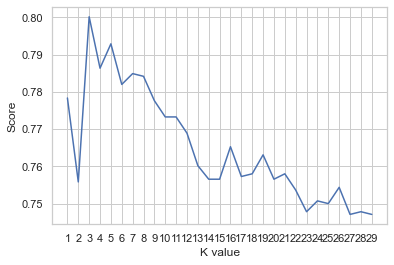

KNN Acc Max 80.01%
at n = 2


In [81]:
scoreListknn = []
for i in range(1,30):
    KNclassifier = KNeighborsClassifier(n_neighbors =i)
    KNclassifier.fit(X_train, y_train)
    scoreListknn.append(KNclassifier.score(X_test, y_test))
    
plt.plot(range(1,30), scoreListknn)
plt.xticks(np.arange(1,30,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()
KNAccMax = max(scoreListknn)
print("KNN Acc Max {:.2f}%".format(KNAccMax*100))
print(f'at n = {np.argmax(scoreListknn)}')

* we can not chosee k=0 nor 1

In [82]:
scores = cross_validate(KNeighborsClassifier(n_neighbors = 3), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.81235802 0.81417537 0.81735575 0.81262775 0.81648876]
Test acc Score: [0.80563124 0.78110808 0.7729337  0.79181818 0.77909091]
------------------------------


## Support Vector Machine (SVM)

In [83]:
from sklearn.svm import SVC
SVCclassifier = SVC(kernel='linear')
SVCclassifier.fit(X_train, y_train)

y_pred = SVCclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


SVCAcc = accuracy_score(y_pred,y_test)
print('SVC accuracy is: {:.2f}%'.format(SVCAcc*100))

              precision    recall  f1-score   support

           0       0.69      0.80      0.74       435
           1       0.61      0.62      0.62       479
           2       0.74      0.63      0.68       462

    accuracy                           0.68      1376
   macro avg       0.68      0.68      0.68      1376
weighted avg       0.68      0.68      0.68      1376

[[346  87   2]
 [ 85 295  99]
 [ 71  98 293]]
SVC accuracy is: 67.88%


In [84]:
scores = cross_validate(SVC(kernel='linear'), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.69582008 0.71149478 0.70445252 0.70883489 0.70111288]
Test acc Score: [0.7102634  0.68029064 0.69663942 0.70363636 0.69181818]
------------------------------


## Naive Bayes
### Categorical NB

In [85]:
NBclassifier1 = CategoricalNB()
NBclassifier1.fit(X_train, y_train)

y_pred = NBclassifier1.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


NBAcc1 = accuracy_score(y_pred,y_test)
print('Naive Bayes accuracy is: {:.2f}%'.format(NBAcc1*100))

              precision    recall  f1-score   support

           0       0.58      0.49      0.53       435
           1       0.57      0.52      0.54       479
           2       0.58      0.70      0.63       462

    accuracy                           0.57      1376
   macro avg       0.57      0.57      0.57      1376
weighted avg       0.57      0.57      0.57      1376

[[214 105 116]
 [105 250 124]
 [ 52  85 325]]
Naive Bayes accuracy is: 57.34%


In [86]:
scores = cross_validate(CategoricalNB(), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.58337119 0.57950931 0.58223535 0.58550988 0.58550988]
Test acc Score: [0.57856494 0.5849228  0.59491371 0.57727273 0.56818182]
------------------------------


## Decision Tree

In [87]:
DTclassifier = DecisionTreeClassifier()
DTclassifier.fit(X_train, y_train)

y_pred = DTclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


DTAcc = accuracy_score(y_pred,y_test)
print('Decision Tree accuracy is: {:.2f}%'.format(DTAcc*100))

              precision    recall  f1-score   support

           0       0.82      0.86      0.84       435
           1       0.75      0.81      0.78       479
           2       0.88      0.77      0.82       462

    accuracy                           0.81      1376
   macro avg       0.82      0.81      0.81      1376
weighted avg       0.82      0.81      0.81      1376

[[376  56   3]
 [ 47 387  45]
 [ 33  75 354]]
Decision Tree accuracy is: 81.18%


In [88]:
scores = cross_validate(DecisionTreeClassifier(), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.84984098 0.85483871 0.85233985 0.85441744 0.85555303]
Test acc Score: [0.82470481 0.79836512 0.81017257 0.80636364 0.80454545]
------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------

## Ensemble Techniques

## RandomForest

In [89]:
RFclassifier = RandomForestClassifier()
RFclassifier.fit(X_train, y_train)

y_pred = RFclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


RFAcc = accuracy_score(y_pred,y_test)
print('Random Forest accuracy is: {:.2f}%'.format(RFAcc*100))

              precision    recall  f1-score   support

           0       0.83      0.86      0.85       435
           1       0.76      0.80      0.78       479
           2       0.88      0.80      0.84       462

    accuracy                           0.82      1376
   macro avg       0.82      0.82      0.82      1376
weighted avg       0.82      0.82      0.82      1376

[[375  57   3]
 [ 47 385  47]
 [ 30  62 370]]
Random Forest accuracy is: 82.12%


In [90]:
scores = cross_validate(RandomForestClassifier(max_leaf_nodes=30), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.77987279 0.78237165 0.77555657 0.76811265 0.76220759]
Test acc Score: [0.78110808 0.75658492 0.77656676 0.76363636 0.73363636]
------------------------------


## Gradeint Boost

In [91]:
GBclassifier = GradientBoostingClassifier()
GBclassifier.fit(X_train, y_train)

y_pred = GBclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


GBAcc = accuracy_score(y_pred,y_test)
print('Gradient Boost accuracy is: {:.2f}%'.format(GBAcc*100))

              precision    recall  f1-score   support

           0       0.88      0.82      0.85       435
           1       0.70      0.81      0.75       479
           2       0.82      0.73      0.78       462

    accuracy                           0.79      1376
   macro avg       0.80      0.79      0.79      1376
weighted avg       0.80      0.79      0.79      1376

[[358  74   3]
 [ 21 389  69]
 [ 30  93 339]]
Gradient Boost accuracy is: 78.92%


In [92]:
scores = cross_validate(GradientBoostingClassifier(), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.8028169  0.80713312 0.80417992 0.80694981 0.79173291]
Test acc Score: [0.79200727 0.77565849 0.78292461 0.80090909 0.76727273]
------------------------------


## AdaBoost

In [93]:
ADAclassifier = AdaBoostClassifier()
ADAclassifier.fit(X_train, y_train)

y_pred = ADAclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


ADAAcc = accuracy_score(y_pred,y_test)
print('Ada Boost accuracy is: {:.2f}%'.format(ADAAcc*100))

              precision    recall  f1-score   support

           0       0.65      0.73      0.69       435
           1       0.66      0.65      0.65       479
           2       0.70      0.63      0.66       462

    accuracy                           0.67      1376
   macro avg       0.67      0.67      0.67      1376
weighted avg       0.67      0.67      0.67      1376

[[316  62  57]
 [ 97 311  71]
 [ 71  98 293]]
Ada Boost accuracy is: 66.86%


In [94]:
scores = cross_validate(AdaBoostClassifier(), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.675602   0.68196274 0.68718764 0.68135362 0.71769248]
Test acc Score: [0.67847411 0.6684832  0.69118983 0.66727273 0.72727273]
------------------------------


## XGBoost

In [95]:
xgbclassifier = XGBClassifier()
xgbclassifier.fit(X_train, y_train)

y_pred = xgbclassifier.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


xgbAcc = accuracy_score(y_pred,y_test)
print('Ada Boost accuracy is: {:.2f}%'.format(xgbAcc*100))

              precision    recall  f1-score   support

           0       0.83      0.86      0.85       435
           1       0.75      0.80      0.78       479
           2       0.88      0.79      0.83       462

    accuracy                           0.82      1376
   macro avg       0.82      0.82      0.82      1376
weighted avg       0.82      0.82      0.82      1376

[[375  57   3]
 [ 47 383  49]
 [ 30  68 364]]
Ada Boost accuracy is: 81.54%


In [96]:
scores = cross_validate(XGBClassifier(), X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Train acc Score: [0.84166288 0.84847796 0.84279873 0.84851238 0.8462412 ]
Test acc Score: [0.83469573 0.81108084 0.83106267 0.82545455 0.80727273]
------------------------------


---------------------------------------------------------------------------------------------------------------------------------------------------------------------

## Hyperparameter Tuning: Grid Search

In [97]:
param_xgb={'learning_rate':[0.01,0.1],'n_estimators':[250,500,700,1000],'max_depth':[5,7,10],'subsample':[0.8,0.9],
           'colsample_bytree':[0.8,0.9],'min_child_weight':[1,3], 'objective':['multi: softmax']}
xgb_model= GridSearchCV(XGBClassifier(),param_xgb,cv=5,n_jobs=-1,scoring='accuracy',verbose=True).fit(X_train,y_train)

Fitting 5 folds for each of 192 candidates, totalling 960 fits


In [98]:
xgb_model.best_params_

{'colsample_bytree': 0.9,
 'learning_rate': 0.1,
 'max_depth': 7,
 'min_child_weight': 1,
 'n_estimators': 500,
 'objective': 'multi: softmax',
 'subsample': 0.8}

In [99]:
xgb_model.best_score_

0.8277286764098755

In [101]:
xgb_model_final=XGBClassifier(learning_rate= 0.1,max_depth=7,colsample_bytree= 0.9,min_child_weight=1,n_estimators=500,
                              subsample=0.8 ,objective='multi:softmax' ,random_state=42).fit(X_train,y_train)

In [102]:
train_pred = xgb_model_final.predict(X_train)
test_pred = xgb_model_final.predict(X_test)

In [111]:
from sklearn.model_selection import cross_val_score
score_acc=accuracy_score(y_test,test_pred)
print('Accuracy test: ',score_acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,test_pred))
print('Classification Report: ','\n',classification_report(y_test,test_pred))
scores = cross_validate(xgb_model_final, X_train, y_train, cv=5, return_train_score=True, n_jobs=-1, scoring = ['accuracy'])
print(f'Train acc Score: {scores["train_accuracy"]}')
print(f'Test acc Score: {scores["test_accuracy"]}')
print('-'*30)

Accuracy test:  0.8197674418604651
Confusion Matrix:  
 [[375  56   4]
 [ 47 385  47]
 [ 30  64 368]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.83      0.86      0.85       435
           1       0.76      0.80      0.78       479
           2       0.88      0.80      0.84       462

    accuracy                           0.82      1376
   macro avg       0.82      0.82      0.82      1376
weighted avg       0.82      0.82      0.82      1376

Train acc Score: [0.84847796 0.85324852 0.85006815 0.85282762 0.85419032]
Test acc Score: [0.84468665 0.81562216 0.83015441 0.82090909 0.81727273]
------------------------------


### The model is enchaced  a little bit a bout 1% ; it;s so far a Generalized Model

---------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [112]:
## i was Using Piepline but SMOTE techniques was not working well with this Multiclass problem that is why i used the above codes with the normal splitting data 

In [87]:
# Define a list of scoring methods you want to use
scoring_methods = ['accuracy','f1_weighted']

# Initialize RFE selector
RFE_selector = RFE(RandomForestClassifier(), n_features_to_select=20)  # You can adjust 

# Initialize Sequential Forwar selector selector
#SFS_selector = SequentialFeatureSelector(LogisticRegression(), forward=True, k_features=15, scoring='roc_auc', cv=5)

# Create the ColumnTransformer
preprocessor = ColumnTransformer(transformers=[('num', StandardScaler(), numerical_cols), 
                                               ('cat', OneHotEncoder(sparse=False,drop='first'), categorical_cols)],
                                               remainder='passthrough')

# Initialize SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42, n_jobs=-1)

for model_name, model in models:
    # Print model name
    print(f"For {model_name}:")

    # Steps Creation
    steps = list()

    steps.append(('preprocessor', preprocessor))
    steps.append(('smote', smote))  # Add SMOTE before feature selection and modeling
    # Choose the feature selector based on your preference
    steps.append(('feature_selector', RFE_selector))  # RFE feature selection
    #steps.append(('feature_selector_sfs', SFS_selector))  # SFS feature selection  

    steps.append((model_name, model))
    

   # Create the ImbalancedPipeline
    imbalanced_pipeline = ImbalancedPipeline(steps=steps)

    # Perform cross-validation with custom scoring function
    cv_results = cross_validate(imbalanced_pipeline, X, y, scoring= scoring_methods , cv=5, return_train_score=True,n_jobs=-1)

    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Print additional metrics
    for i, (train_index, test_index) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        imbalanced_pipeline.fit(X_train, y_train)
        y_pred = imbalanced_pipeline.predict(X_test)
        y_train_pred = imbalanced_pipeline.predict(X_train)
        print(f"Fold {i + 1}:")
        print("Confusion Matrix:")
        print(confusion_matrix(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("*" * 50)

For LR:
Fold 1:
Confusion Matrix:
[[253  99 103]
 [ 11  28  13]
 [  1   2   1]]
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.56      0.70       455
           1       0.22      0.54      0.31        52
           2       0.01      0.25      0.02         4

    accuracy                           0.55       511
   macro avg       0.39      0.45      0.34       511
weighted avg       0.87      0.55      0.66       511

**************************************************
Fold 2:
Confusion Matrix:
[[248 136  70]
 [ 21  23   8]
 [  2   2   1]]
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.55      0.68       454
           1       0.14      0.44      0.22        52
           2       0.01      0.20      0.02         5

    accuracy                           0.53       511
   macro avg       0.36      0.40      0.31       511
weighted avg       0.83      0.53      0.63 

Fold 2:
Confusion Matrix:
[[405  46   3]
 [ 42  10   0]
 [  3   2   0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       454
           1       0.17      0.19      0.18        52
           2       0.00      0.00      0.00         5

    accuracy                           0.81       511
   macro avg       0.36      0.36      0.36       511
weighted avg       0.82      0.81      0.81       511

**************************************************
Fold 3:
Confusion Matrix:
[[405  47   2]
 [ 32  18   2]
 [  1   2   1]]
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.89      0.91       454
           1       0.27      0.35      0.30        52
           2       0.20      0.25      0.22         4

    accuracy                           0.83       510
   macro avg       0.46      0.50      0.48       510
weighted avg       0.85      0.83      0.84       51

Fold 3:
Confusion Matrix:
[[336 114   4]
 [ 17  35   0]
 [  2   2   0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.74      0.83       454
           1       0.23      0.67      0.34        52
           2       0.00      0.00      0.00         4

    accuracy                           0.73       510
   macro avg       0.39      0.47      0.39       510
weighted avg       0.87      0.73      0.77       510

**************************************************
Fold 4:
Confusion Matrix:
[[318 131   5]
 [ 29  21   2]
 [  2   2   0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.70      0.79       454
           1       0.14      0.40      0.20        52
           2       0.00      0.00      0.00         4

    accuracy                           0.66       510
   macro avg       0.35      0.37      0.33       510
weighted avg       0.83      0.66      0.73       51

## Saving important objects For Deploying

In [113]:
import joblib as jb
jb.dump(xgb_model_final,"Model_Final.pkl")
jb.dump(X_n.columns,"Inputs_Final.pkl")

['Inputs_Final.pkl']